In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from datetime import timedelta, datetime
#import holidays

import matplotlib
import pickle
import seaborn as sns

import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go

matplotlib.pyplot.style.use('ggplot')
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.6f' % x)
pd.set_option('display.width', 500)

In [2]:
targets_train = pd.read_csv('../../../data/targets_train.csv')
uf_test = pd.read_csv('../../../data/user_features_test.csv')
uf_train = pd.read_csv('../../../data/user_features_train.csv')
users_test = pd.read_csv('../../../data/users_test.csv')
users_train = pd.read_csv('../../../data/users_train.csv')

In [3]:
df_train = pd.read_csv('../../../data/df_train_preprocessed.csv')

In [4]:
df_train.shape

(878594, 29)

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878594 entries, 0 to 878593
Data columns (total 29 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ID                      878594 non-null  int64  
 1   TARGET                  878594 non-null  float64
 2   open_year               878594 non-null  int64  
 3   open_month              878594 non-null  int64  
 4   first_prediction        852859 non-null  float64
 5   log_first_prediction    852859 non-null  float64
 6   economic_class          878594 non-null  object 
 7   log_TARGET              878594 non-null  float64
 8   Retention_count_D0_3    878594 non-null  int64  
 9   Retention_count_D4_7    878594 non-null  int64  
 10  Retention_count_D8_11   878594 non-null  int64  
 11  Retention_count_D12_15  878594 non-null  int64  
 12  Avg_Lvl_Count_D0_3      878594 non-null  float64
 13  Avg_Lvl_Count_D4_7      878594 non-null  float64
 14  Avg_Lvl_Count_D8_11 

In [6]:
df_train.describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
count,878594.000000,878594.000000,878594.000000,878594.000000,852859.000000,852859.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000,878594.000000
mean,439296.500000,0.177885,2024.000000,2.924075,37.612360,2.501908,-21.350343,1.927464,0.731040,0.524095,0.426645,5.392872,1.813482,1.222791,0.981307,78.411400,113.566753,84.003516,0.200325,0.061346,0.038786,0.029909,0.001671,0.000382,0.000230,0.000199,0.330367,0.002482
std,253628.385542,1.770452,0.000000,1.384833,87.799145,1.512796,12.742148,1.055067,1.161900,1.020840,0.936734,8.789770,6.096139,5.002386,4.566252,506.256013,141.577066,217.316191,0.803538,0.396602,0.328504,0.289959,0.078269,0.033182,0.024075,0.023644,1.431906,0.102799
min,0.000000,0.000000,2024.000000,1.000000,0.000100,-9.210174,-30.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,219648.250000,0.000000,2024.000000,2.000000,3.932556,1.369290,-30.000000,1.000000,0.000000,0.000000,0.000000,1.250000,0.000000,0.000000,0.000000,31.000000,33.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,439296.500000,0.000000,2024.000000,3.000000,11.414559,2.434890,-30.000000,2.000000,0.000000,0.000000,0.000000,2.750000,0.000000,0.000000,0.000000,54.333333,90.750000,66.000000,0.010095,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.023469,0.000000
75%,658944.750000,0.012256,2024.000000,4.000000,35.876447,3.580081,-4.401768,3.000000,1.000000,1.000000,0.000000,5.500000,0.750000,0.000000,0.000000,93.333333,155.500000,122.666667,0.112803,0.005634,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.192614,0.000000
max,878593.000000,386.494019,2024.000000,5.000000,4944.476604,8.506026,5.957116,4.000000,4.000000,4.000000,4.000000,353.000000,299.750000,296.250000,312.750000,328605.666667,12569.000000,165415.666667,91.707404,56.353756,85.259599,101.214085,27.950000,10.400000,5.200000,6.500000,295.808025,27.950000


In [7]:
df_train['economic_class'].value_counts()

economic_class
lower_middle_class    404918
upper_middle_class    387587
wealthy                35752
Nan                    25735
poor                   24602
Name: count, dtype: int64

In [8]:
df_train[df_train['economic_class'] == 'Nan'].head()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,economic_class,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
9,9,0.000000,2024,3,NaN,NaN,Nan,-30.000000,2,0,0,0,4.500000,0.000000,0.000000,0.000000,30.666667,51.000000,61.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
52,52,0.000000,2024,2,NaN,NaN,Nan,-30.000000,1,0,0,0,3.500000,0.000000,0.000000,0.000000,66.666667,145.750000,83.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
80,80,0.000000,2024,1,NaN,NaN,Nan,-30.000000,1,0,0,0,0.250000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
110,110,0.000000,2024,4,NaN,NaN,Nan,-30.000000,2,1,0,0,6.000000,1.000000,0.000000,0.000000,69.000000,122.750000,134.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
135,135,0.000000,2024,5,NaN,NaN,Nan,-30.000000,2,1,0,0,0.500000,0.000000,0.000000,0.000000,29.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [9]:
df_train[df_train['economic_class'] == 'Nan'].describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
count,25735.000000,25735.000000,25735.000000,25735.000000,0.000000,0.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000
mean,439579.886108,0.016357,2024.000000,2.895434,NaN,NaN,-28.939090,1.507130,0.313386,0.214028,0.169031,3.153827,0.792267,0.525792,0.409782,101.731339,70.397173,47.684515,0.008382,0.002579,0.002087,0.001836,0.000278,0.000000,0.000000,0.000177,0.014883,0.000455
std,253715.719763,0.398262,0.000000,1.401290,NaN,NaN,5.181433,0.832811,0.783652,0.660336,0.593307,7.227029,4.241614,3.558162,3.039192,1636.377305,109.405737,95.140957,0.143349,0.049164,0.050008,0.050051,0.025943,0.000000,0.000000,0.020259,0.228178,0.032915
min,9.000000,0.000000,2024.000000,1.000000,NaN,NaN,-30.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,220151.000000,0.000000,2024.000000,2.000000,NaN,NaN,-30.000000,1.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,438941.000000,0.000000,2024.000000,3.000000,NaN,NaN,-30.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,53.000000,35.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,658637.000000,0.000000,2024.000000,4.000000,NaN,NaN,-30.000000,2.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,93.666667,113.750000,81.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,878556.000000,43.283070,2024.000000,5.000000,NaN,NaN,3.767762,4.000000,4.000000,4.000000,4.000000,144.500000,115.000000,120.000000,139.250000,206586.666667,4943.000000,4653.000000,10.068451,4.187328,3.464292,4.338992,2.600000,0.000000,0.000000,2.600000,15.199091,2.600000


In [10]:
df_train[(df_train['economic_class'] == 'Nan') & (df_train['log_TARGET'] > -30.0)].describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
count,1050.000000,1050.000000,1050.000000,1050.000000,0.000000,0.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000
mean,437393.105714,0.400910,2024.000000,1.962857,NaN,NaN,-3.997600,2.146667,1.193333,1.060000,0.985714,7.193095,4.104524,3.636190,3.117143,767.410794,111.427143,96.779683,0.084399,0.050422,0.043086,0.042989,0.002476,0.000000,0.000000,0.001857,0.220896,0.004333
std,248396.380902,1.933070,0.000000,1.334285,NaN,NaN,3.075419,1.127443,1.377247,1.359646,1.331150,12.197651,9.893322,10.145070,9.251380,7989.878474,184.109614,124.935824,0.346159,0.222775,0.220443,0.243936,0.080238,0.000000,0.000000,0.060178,0.856692,0.100251
min,1337.000000,0.000000,2024.000000,1.000000,NaN,NaN,-15.474366,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,223255.000000,0.003798,2024.000000,1.000000,NaN,NaN,-5.573452,1.000000,0.000000,0.000000,0.000000,0.750000,0.000000,0.000000,0.000000,34.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,437769.000000,0.025019,2024.000000,1.000000,NaN,NaN,-3.688126,2.000000,1.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,64.333333,90.125000,74.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003986,0.000000
75%,646932.250000,0.135621,2024.000000,3.000000,NaN,NaN,-1.997894,3.000000,2.000000,2.000000,2.000000,8.000000,3.937500,2.437500,2.250000,110.000000,157.375000,142.250000,0.021247,0.007248,0.002916,0.002982,0.000000,0.000000,0.000000,0.000000,0.088566,0.000000
max,877766.000000,43.283070,2024.000000,5.000000,NaN,NaN,3.767762,4.000000,4.000000,4.000000,4.000000,144.500000,100.750000,115.250000,139.250000,206586.666667,4943.000000,1561.333333,4.077577,4.187328,3.464292,4.338992,2.600000,0.000000,0.000000,1.950000,15.199091,2.600000


In [11]:
df_train[(df_train['economic_class'] == 'Nan') & (df_train['log_TARGET'] > -30.0)].head()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,economic_class,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
1337,1337,0.298266,2024,1,NaN,NaN,Nan,-1.209771,4,1,1,1,22.000000,13.750000,8.250000,4.250000,80.000000,123.250000,94.333333,0.002353,0.007744,0.017397,0.016221,0.000000,0.000000,0.000000,0.000000,0.043714,0.000000
1641,1641,0.004776,2024,1,NaN,NaN,Nan,-5.344152,1,0,0,0,2.000000,0.000000,0.000000,0.000000,55.000000,149.250000,36.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3063,3063,0.244729,2024,1,NaN,NaN,Nan,-1.407602,3,2,3,1,3.500000,1.750000,2.750000,1.000000,93.666667,156.750000,151.666667,0.039640,0.021197,0.045857,0.012533,0.000000,0.000000,0.000000,0.000000,0.119227,0.000000
3372,3372,5.885815,2024,2,NaN,NaN,Nan,1.772545,4,4,3,4,1.750000,0.750000,1.000000,2.500000,0.000000,0.000000,0.000000,0.492855,0.361771,0.345642,0.322808,0.000000,0.000000,0.000000,0.000000,1.523077,0.000000
3886,3886,1.393645,2024,4,NaN,NaN,Nan,0.331923,3,4,4,3,2.000000,2.000000,3.250000,4.500000,16781.333333,0.000000,0.000000,0.133478,0.135622,0.131277,0.125510,0.000000,0.000000,0.000000,0.000000,0.525887,0.000000


In [13]:
df_train[(df_train['economic_class'] == 'Nan') & (df_train['log_TARGET'] > -30.0) & (df_train['TARGET'] > 1.0)].describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
count,78.000000,78.000000,78.000000,78.000000,0.000000,0.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000
mean,440538.705128,4.224752,2024.000000,2.076923,NaN,NaN,1.017468,2.602564,2.192308,2.141026,2.269231,8.570513,7.862179,11.310897,11.330128,4266.141026,63.717949,66.713675,0.466041,0.355897,0.387305,0.398088,0.000000,0.000000,0.000000,0.000000,1.607332,0.000000
std,265152.578990,5.874354,0.000000,1.457352,NaN,NaN,0.803243,1.220387,1.537899,1.718685,1.656730,14.819580,14.622059,21.218682,20.429698,12394.304691,97.217543,117.005170,0.824105,0.631123,0.694899,0.796575,0.000000,0.000000,0.000000,0.000000,2.451155,0.000000
min,3372.000000,1.023104,2024.000000,1.000000,NaN,NaN,0.022841,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,202940.500000,1.515529,2024.000000,1.000000,NaN,NaN,0.415706,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000052,0.000044,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.275066,0.000000
50%,472900.000000,2.310486,2024.000000,1.000000,NaN,NaN,0.837452,3.000000,2.500000,2.000000,3.000000,4.000000,3.250000,3.250000,4.250000,45.333333,0.000000,0.000000,0.142537,0.129647,0.142554,0.114744,0.000000,0.000000,0.000000,0.000000,0.625521,0.000000
75%,683566.000000,3.730070,2024.000000,3.000000,NaN,NaN,1.316023,4.000000,4.000000,4.000000,4.000000,10.687500,10.750000,12.500000,13.687500,149.916667,93.562500,96.750000,0.427203,0.377757,0.336896,0.307058,0.000000,0.000000,0.000000,0.000000,1.692690,0.000000
max,871466.000000,43.283070,2024.000000,5.000000,NaN,NaN,3.767762,4.000000,4.000000,4.000000,4.000000,100.500000,100.750000,115.250000,139.250000,64400.000000,375.750000,678.666667,4.077577,4.187328,3.464292,4.338992,0.000000,0.000000,0.000000,0.000000,15.199091,0.000000


In [ ]:
# First intention was classifing nan values into economic classes according their user data like device_brand, country etc. 
# However after looking at the data, we can conclude that if first_prediction is nan than TARGET tends to be 0.0 . 
# Maybe in order to calculate first_prediction user must accept some term and maybe first prediction nan means user did not accept terms 
# and did not play the game. 

# Because of that I decide to train classifier which determines the TARGET will be 0.0 or not which probably means user played game or not.
# Then I will train regressor for estimating TARGET for non-zero TARGET values as I did for other economic classes. 

In [14]:
df_nan = df_train[df_train['economic_class'] == 'Nan']

In [15]:
df_nan.to_csv('../data/train_economic_class/df_nan.csv', index=False)

In [16]:
df_nan.shape

(25735, 29)

In [17]:
df_nan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25735 entries, 9 to 878556
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      25735 non-null  int64  
 1   TARGET                  25735 non-null  float64
 2   open_year               25735 non-null  int64  
 3   open_month              25735 non-null  int64  
 4   first_prediction        0 non-null      float64
 5   log_first_prediction    0 non-null      float64
 6   economic_class          25735 non-null  object 
 7   log_TARGET              25735 non-null  float64
 8   Retention_count_D0_3    25735 non-null  int64  
 9   Retention_count_D4_7    25735 non-null  int64  
 10  Retention_count_D8_11   25735 non-null  int64  
 11  Retention_count_D12_15  25735 non-null  int64  
 12  Avg_Lvl_Count_D0_3      25735 non-null  float64
 13  Avg_Lvl_Count_D4_7      25735 non-null  float64
 14  Avg_Lvl_Count_D8_11     25735 non-null  fl

In [18]:
df_nan.describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
count,25735.000000,25735.000000,25735.000000,25735.000000,0.000000,0.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000,25735.000000
mean,439579.886108,0.016357,2024.000000,2.895434,NaN,NaN,-28.939090,1.507130,0.313386,0.214028,0.169031,3.153827,0.792267,0.525792,0.409782,101.731339,70.397173,47.684515,0.008382,0.002579,0.002087,0.001836,0.000278,0.000000,0.000000,0.000177,0.014883,0.000455
std,253715.719763,0.398262,0.000000,1.401290,NaN,NaN,5.181433,0.832811,0.783652,0.660336,0.593307,7.227029,4.241614,3.558162,3.039192,1636.377305,109.405737,95.140957,0.143349,0.049164,0.050008,0.050051,0.025943,0.000000,0.000000,0.020259,0.228178,0.032915
min,9.000000,0.000000,2024.000000,1.000000,NaN,NaN,-30.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,220151.000000,0.000000,2024.000000,2.000000,NaN,NaN,-30.000000,1.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,438941.000000,0.000000,2024.000000,3.000000,NaN,NaN,-30.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,53.000000,35.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,658637.000000,0.000000,2024.000000,4.000000,NaN,NaN,-30.000000,2.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,93.666667,113.750000,81.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,878556.000000,43.283070,2024.000000,5.000000,NaN,NaN,3.767762,4.000000,4.000000,4.000000,4.000000,144.500000,115.000000,120.000000,139.250000,206586.666667,4943.000000,4653.000000,10.068451,4.187328,3.464292,4.338992,2.600000,0.000000,0.000000,2.600000,15.199091,2.600000


In [19]:
df_nan.head()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,economic_class,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue
9,9,0.000000,2024,3,NaN,NaN,Nan,-30.000000,2,0,0,0,4.500000,0.000000,0.000000,0.000000,30.666667,51.000000,61.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
52,52,0.000000,2024,2,NaN,NaN,Nan,-30.000000,1,0,0,0,3.500000,0.000000,0.000000,0.000000,66.666667,145.750000,83.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
80,80,0.000000,2024,1,NaN,NaN,Nan,-30.000000,1,0,0,0,0.250000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
110,110,0.000000,2024,4,NaN,NaN,Nan,-30.000000,2,1,0,0,6.000000,1.000000,0.000000,0.000000,69.000000,122.750000,134.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
135,135,0.000000,2024,5,NaN,NaN,Nan,-30.000000,2,1,0,0,0.500000,0.000000,0.000000,0.000000,29.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [20]:
df_nan[(round(df_nan['log_TARGET'], 1) <= -29.9)].count()

ID                        24685
TARGET                    24685
open_year                 24685
open_month                24685
first_prediction              0
log_first_prediction          0
economic_class            24685
log_TARGET                24685
Retention_count_D0_3      24685
Retention_count_D4_7      24685
Retention_count_D8_11     24685
Retention_count_D12_15    24685
Avg_Lvl_Count_D0_3        24685
Avg_Lvl_Count_D4_7        24685
Avg_Lvl_Count_D8_11       24685
Avg_Lvl_Count_D12_15      24685
Avg_Duration_Lvl0_3       24685
Avg_Duration_Lvl4_7       24685
Avg_Duration_Lvl8_10      24685
Total_AdRevenueD0_3       24685
Total_AdRevenueD4_7       24685
Total_AdRevenueD8_11      24685
Total_AdRevenueD12_15     24685
Total_IAPRevenueD0_3      24685
Total_IAPRevenueD4_7      24685
Total_IAPRevenueD8_11     24685
Total_IAPRevenueD12_15    24685
Total_AdRevenue           24685
Total_IAPRevenue          24685
dtype: int64

In [22]:
df_nan['target_class'] = np.where(round(df_nan['log_TARGET'], 1) <= -29.9, 1, 0) # class 1 means TARGET is 0.0 

/var/folders/w5/m6rwwhxs3f79c4v89rgmvnw40000gn/T/ipykernel_23236/4077299439.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nan['target_class'] = np.where(round(df_nan['log_TARGET'], 1) <= -29.9, 1, 0) # class 1 means TARGET is 0.0


In [27]:
df_nan['target_class'].value_counts()

target_class
1    24685
0     1050
Name: count, dtype: int64

In [28]:
X_cols = [col for col in df_nan.columns if col not in ['ID', 'open_year', 'open_month', 'economic_class', 'TARGET', 'log_TARGET',
                                                      'first_prediction', 'log_first_prediction']]

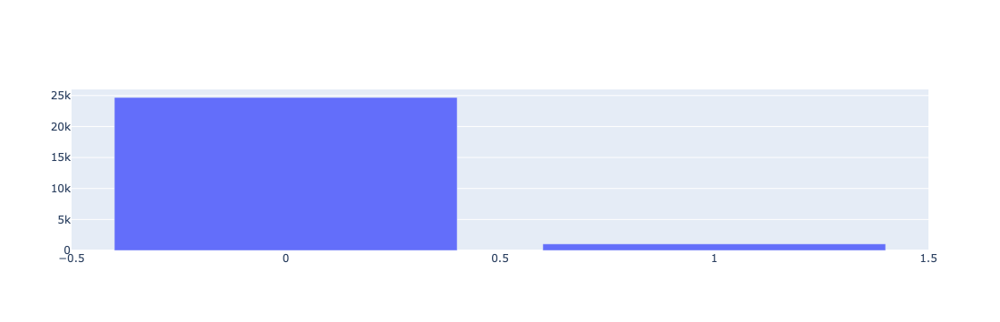

In [30]:
fig = go.Figure([go.Bar(x = [0, 1], y = df_nan.target_class.value_counts())])
fig.show()

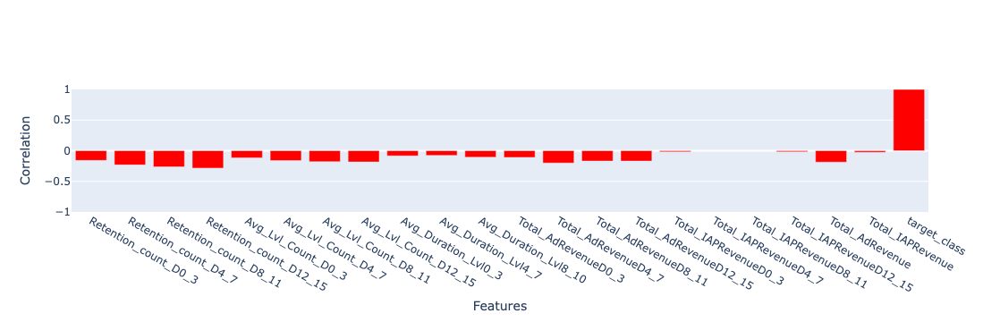

In [31]:
target_corr = df_nan[X_cols].corr()['target_class']

fig = go.Figure([go.Bar(y = target_corr, x = target_corr.index, marker_color = 'red')])

fig.update_layout(xaxis_title = "Features", yaxis_title = "Correlation",
    yaxis = dict(
        range=(-1, 1),
        showticklabels=True
    ))
fig.show()

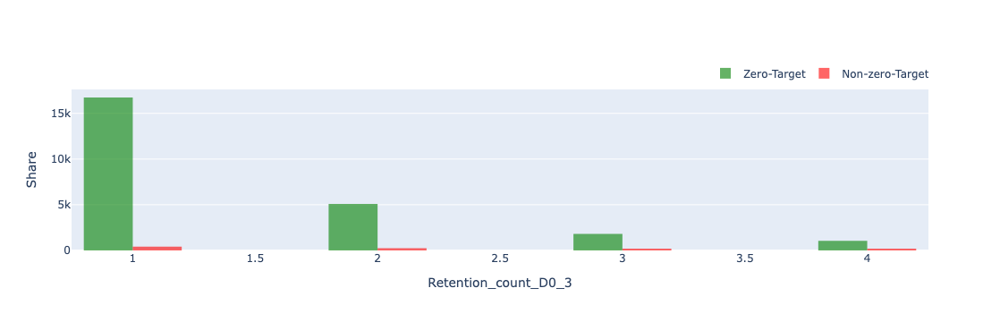

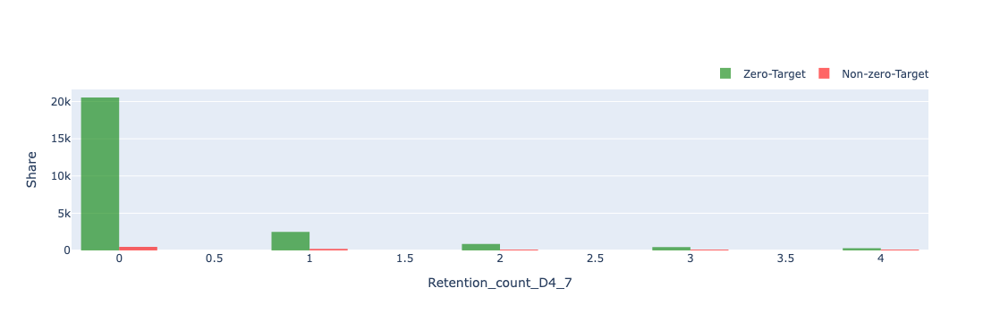

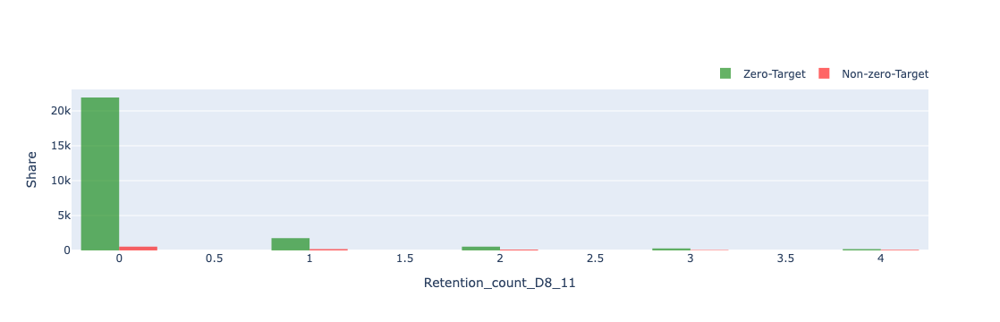

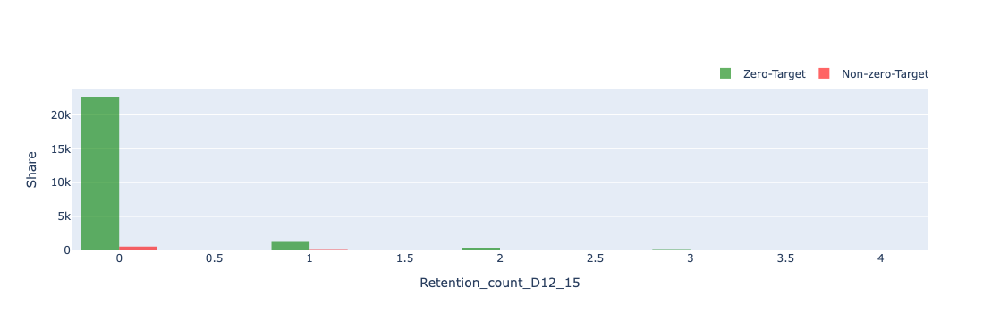

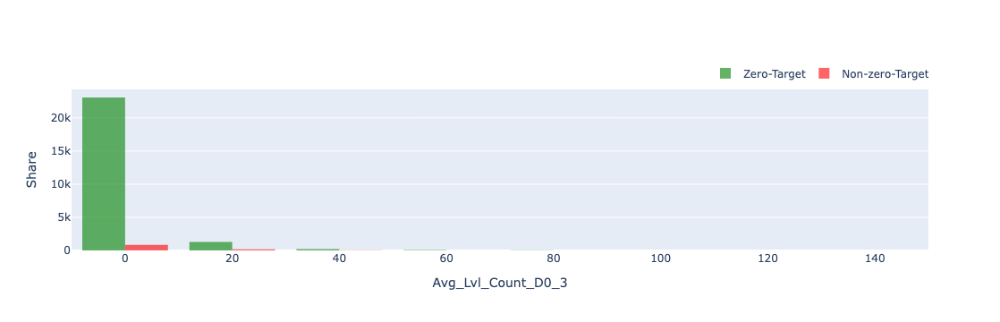

...

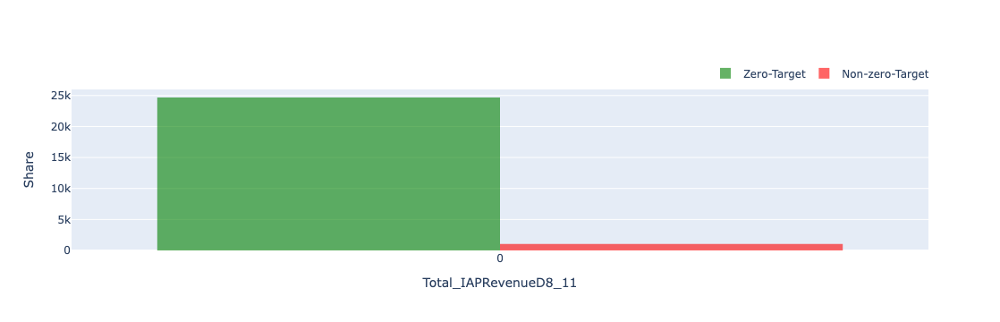

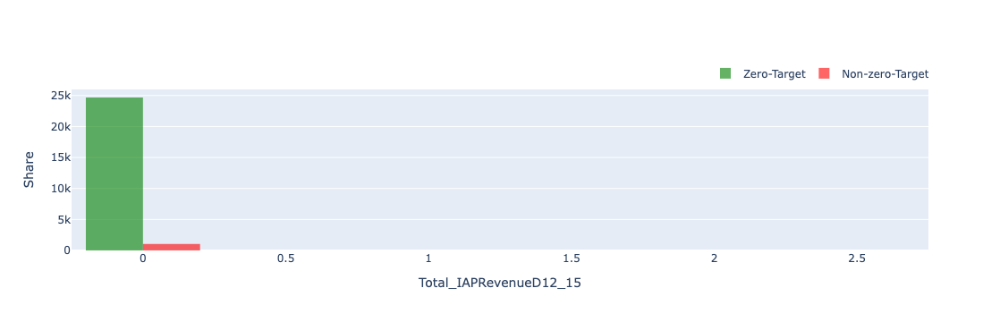

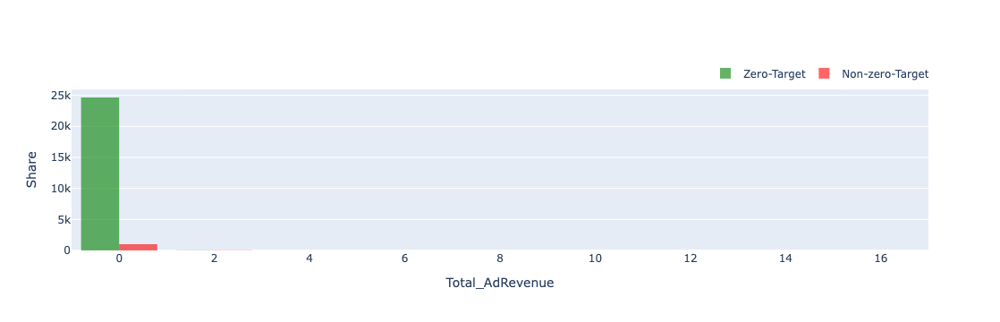

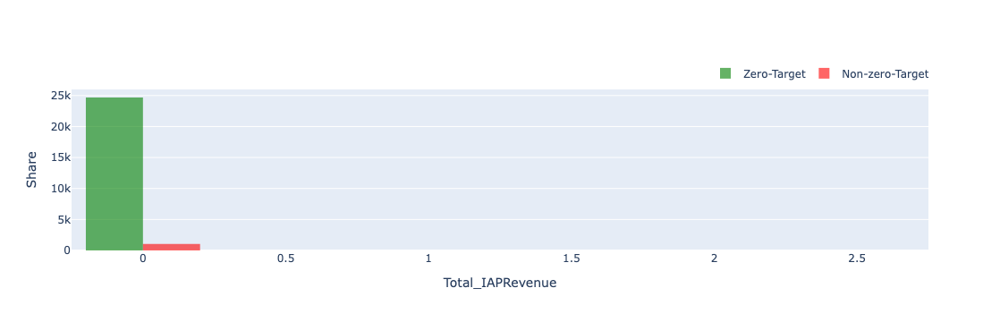

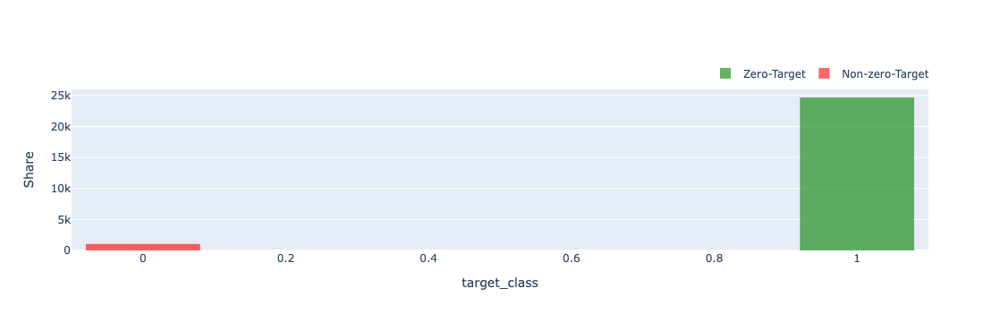

In [32]:
for feature in X_cols:

    fig = go.Figure()
    fig.add_trace(go.Histogram(x = df_nan[df_nan.target_class == 1][feature],
                 marker_color = 'green', opacity = 0.6, nbinsx = 10,  name = 'Zero-Target'))

    fig.add_trace(go.Histogram(x = df_nan[df_nan.target_class == 0][feature],
                 marker_color = 'red', opacity = 0.6,nbinsx = 10, name = 'Non-zero-Target'))

    fig.update_layout(
        legend = dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
        ),
        xaxis_title = feature,
        yaxis_title = "Share"
    )
    fig.show()

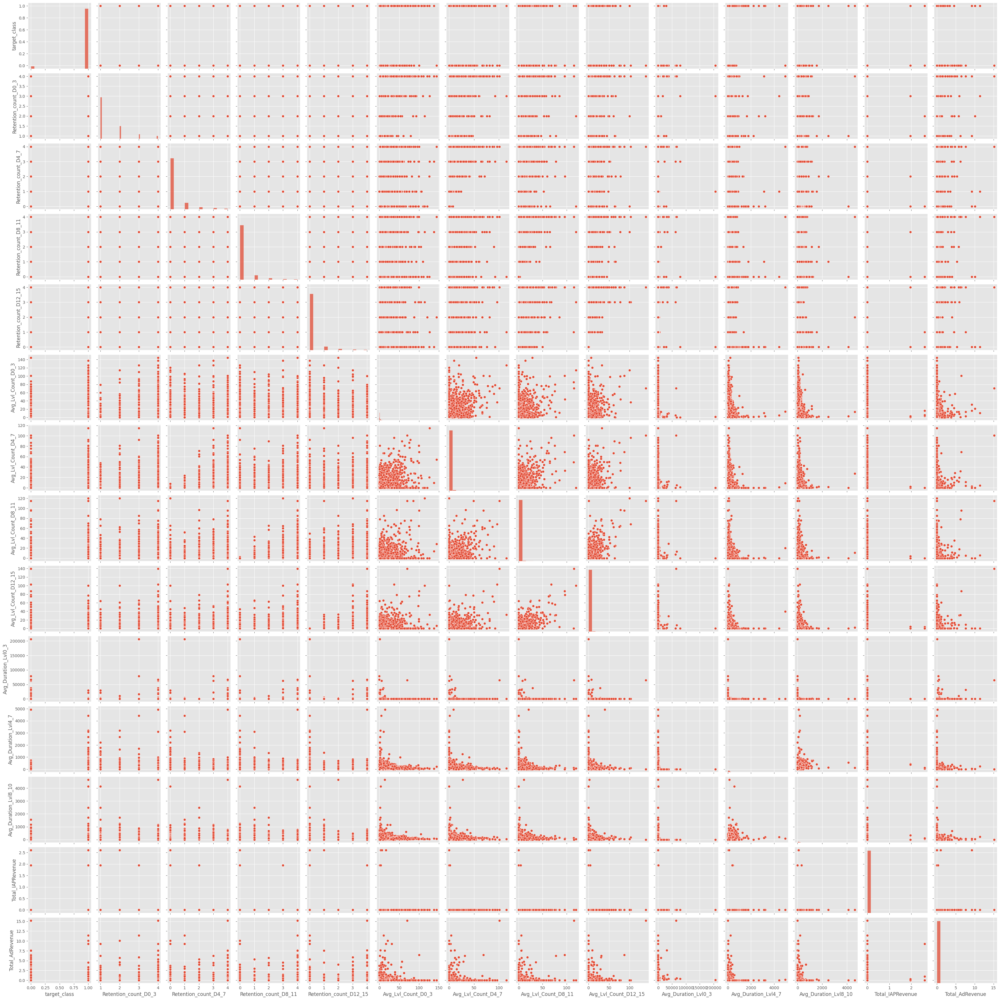

In [33]:
sns.pairplot(df_nan.loc[:,['target_class', 
                    'Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
                      'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
                     'Avg_Duration_Lvl0_3',	'Avg_Duration_Lvl4_7',	'Avg_Duration_Lvl8_10',
                       'Total_IAPRevenue', 'Total_AdRevenue']])

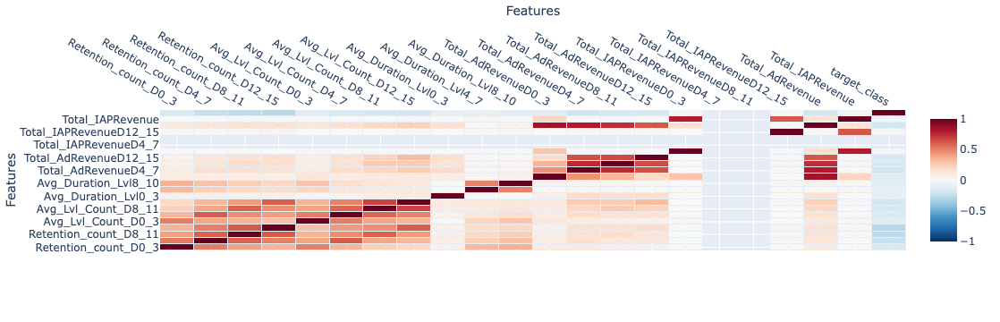

In [34]:
correlation_matrix = df_nan[X_cols].corr()

fig = go.Figure(data=go.Heatmap(
                   z = correlation_matrix,
                   x = correlation_matrix.columns,
                   y = correlation_matrix.index,
                   hoverongaps = False,
                   xgap = 1,
                   ygap = 1,
                   zmin = -1,
                   zmax = 1,
    colorscale = 'rdbu_r'
))

fig.update_xaxes(side="top")
fig.update_layout(xaxis_title = "Features", yaxis_title = "Features")
fig.show()

**Model**

In [35]:
X_cols = ['Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
          'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
          'Avg_Duration_Lvl0_3',	'Avg_Duration_Lvl4_7',	'Avg_Duration_Lvl8_10',
          'Total_IAPRevenue', 'Total_AdRevenue']

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score

In [37]:
model = RandomForestClassifier(random_state = 128)

In [38]:
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(df_nan[X_cols]), columns=df_nan[X_cols].columns)

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, df_nan.target_class, test_size=0.2, random_state=42)

In [40]:
model.fit(X_train, y_train)

train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

train_acc = accuracy_score(y_train, train_predictions)
test_acc = accuracy_score(y_test, test_predictions)

f1_train = f1_score(y_train, train_predictions)
f1_test = f1_score(y_test, test_predictions)

cm = confusion_matrix(y_test, test_predictions)

In [41]:
print(train_acc)
print(test_acc)

print(f1_train)
print(f1_test)

0.9963085292403342
0.9685253545754808
0.9980792559644157
0.9837512537612838


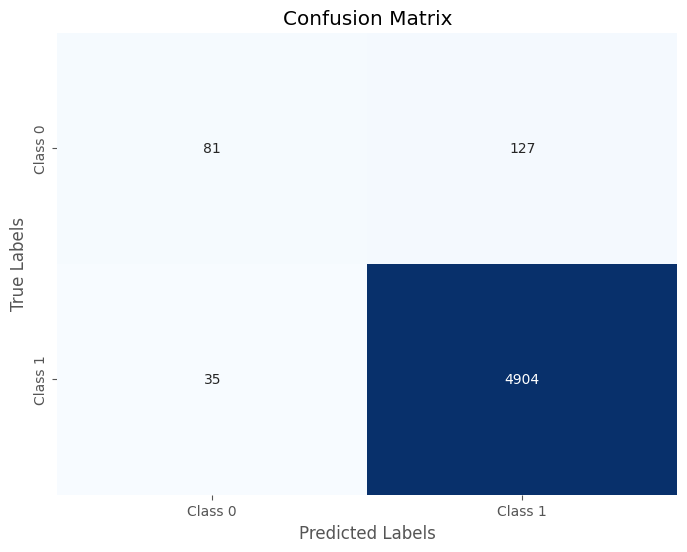

In [42]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [43]:
importances = model.feature_importances_

feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

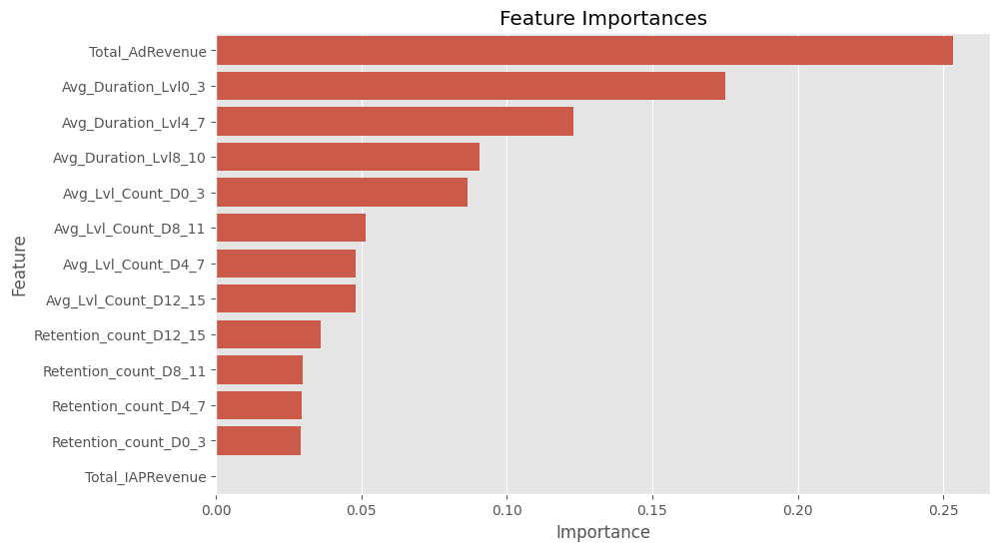

In [44]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()

In [45]:
with open('../../../models/nan_classifier.pkl', 'wb') as file:
    pickle.dump(model, file)